# Ligand Perturbation

This notebook walks through simulating the overexpression of the IL21 ligand and
studying the shift in cell profile across T cells in human tonsils

In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import scanpy as sc
import sys 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
sys.path.append('/Users/koush/Projects/SpaceOracle/src')

In [4]:
%matplotlib inline

figure_params = {
    'dpi': 300, 
    'bbox_inches': 'tight', 
    'format': 'svg', 
    'transparent': True
}

plt.rcParams.update({
    "text.usetex": False,
    "svg.fonttype": 'none'
})

In [5]:
import warnings
warnings.simplefilter("ignore")

In [6]:
from SpaceTravLR.virtual_tissue import VirtualTissue

In [51]:
adata = sc.read_h5ad('/Volumes/SSD/training_data/snrna_human_tonsil.h5ad')
adata

AnnData object with n_obs × n_vars = 5778 × 3333
    obs: 'cell_type', 'author_cell_type', 'cell_type_int', 'banksy_celltypes', 'cell_type_2'
    uns: 'cell_thresholds', 'cell_type_int_colors', 'received_ligands', 'received_ligands_tfl'
    obsm: 'spatial', 'spatial_unscaled'
    layers: 'imputed_count', 'normalized_count'

In [52]:
adata.obsm['X_umap'] = sc.read_h5ad(
    '/Volumes/SSD/training_data/snrna_human_tonsil_v2.h5ad'
).obsm['X_umap']

In [8]:
# adata.layers['imputed_count'] = pd.read_parquet(
#     '/Volumes/SSD/training_data/human_tonsil_imputed.parquet'
# ).loc[adata.obs_names].values

# adata.obsm['X_umap'] = pd.read_csv(
#     '/Users/koush/Projects/SpaceOracle copy/notebooks/human_tonsil/umap.csv', index_col=0).values

### Define color palette

In [8]:
color_dict = {
    'Naive CD4 T': '#f721b7',
    'Treg': '#ecc91d',
    'T memory': '#3a9c2b',
    'Th1': '#c43cf2',
    'Th2': '#5e6ff3',
    'T_CD8': '#dd3652',
    'T_follicular_helper': '#e28723',
}

### Setup a VirtualTissue for loading and visualizing perturbations

In [58]:
import pandas as pd
import numpy as np
import dcor 
from tqdm import tqdm

In [141]:
import pandas as pd
import numpy as np
import dcor
from tqdm import tqdm
import umap
import pandas as pd
import numpy as np
import dcor
from tqdm import tqdm
import umap


import pandas as pd
import numpy as np
import dcor
from tqdm import tqdm

def compute_biological_edist(
    wt_df,
    ko_df,
    adata,
    cell_type_col='cell_type_2',
    n_permutations=100,
    seed=42
):
    """
    Calculates Energy Distance in full expression space with permutation testing.
    """
    np.random.seed(seed)
    
    # 1. Align indices and features
    common_cells = wt_df.index.intersection(ko_df.index).intersection(adata.obs_names)
    common_genes = wt_df.columns.intersection(ko_df.columns)
    
    wt_sub = wt_df.loc[common_cells, common_genes].values
    ko_sub = ko_df.loc[common_cells, common_genes].values
    labels = adata.obs.loc[common_cells, cell_type_col].values
    
    unique_types = np.unique(labels)
    results = []

    print(f"Analyzing {len(unique_types)} cell types in {len(common_genes)}D space...")

    for c_type in tqdm(unique_types):
        idx = np.where(labels == c_type)[0]
        
        if len(idx) < 5:  # Minimum threshold for biological relevance
            continue

        group_wt = wt_sub[idx]
        group_ko = ko_sub[idx]

        # Calculate Observed Energy Distance
        observed_dist = dcor.energy_distance(group_wt, group_ko)

        # 2. Permutation Test (The "Real" Check)
        # We shuffle labels to see if the distance is higher than random chance
        combined = np.vstack([group_wt, group_ko])
        n_wt = len(group_wt)
        
        null_dist = []
        for _ in range(n_permutations):
            shuffled = np.random.permutation(combined)
            null_dist.append(dcor.energy_distance(shuffled[:n_wt], shuffled[n_wt:]))
        
        p_value = (np.sum(np.array(null_dist) >= observed_dist) + 1) / (n_permutations + 1)
        
        results.append({
            'cell_type': c_type,
            'e_distance': observed_dist,
            'p_value': p_value,
            'n_cells': len(idx)
        })

    res_df = pd.DataFrame(results).set_index('cell_type').sort_values('e_distance', ascending=False)
    return res_df



def compute_per_celltype_edist_umap(
    adata,
    perturbed_df,
    n_comps=2,
    cell_type_col='cell_type',
    layer='imputed_count',
    n_neighbors=15,
    min_dist=0.1,
):
    """
    Calculates Energy Distance in a shared UMAP space.
    """

    # 1. Extract and align
    imputed_df = adata.to_df(layer=layer)

    common_genes = imputed_df.columns.intersection(perturbed_df.columns)
    common_cells = imputed_df.index.intersection(perturbed_df.index)

    imp_sub = imputed_df.loc[common_cells, common_genes]
    per_sub = perturbed_df.loc[common_cells, common_genes]

    # 2. Shared UMAP embedding
    combined = pd.concat([imp_sub, per_sub], axis=0)

    print(f"Running UMAP with {n_comps} components...")
    reducer = umap.UMAP(
        n_components=n_comps,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric="euclidean",
        random_state=0
    )

    umap_results = reducer.fit_transform(combined)

    # split back
    n_cells = len(common_cells)
    imp_umap = umap_results[:n_cells]
    per_umap = umap_results[n_cells:]

    # 3. cell type labels
    labels = adata.obs.loc[common_cells, cell_type_col].values
    unique_types = np.unique(labels)

    results = {}
    print(f"Computing distances for {len(unique_types)} groups...")

    for c_type in tqdm(unique_types):

        idx = np.where(labels == c_type)[0]
        if len(idx) == 0:
            continue

        group_a = imp_umap[idx]
        group_b = per_umap[idx]

        dist = dcor.energy_distance(group_a, group_b)
        results[c_type] = dist

    return pd.Series(results, name="e_distance_umap").sort_values(ascending=False)

In [ ]:
from tqdm.notebook import tqdm

In [87]:
perturbed_df = adata.to_df(layer='imputed_count')
perturbed_df.loc[adata.obs['cell_type_2'] == 'plasma', 'IL21'] = 10

In [114]:
# perturbed_df = pd.read_parquet('/tmp/IL21_4n_0x.parquet')
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil/FOXO1_4n_0x.parquet')

edist_results = compute_per_celltype_edist_pca(
    adata, perturbed_df, n_comps=50, cell_type_col='cell_type')

Running PCA with 50 components...
Computing distances for 13 groups...


In [140]:
compute_per_celltype_edist_matrix(
    pd.read_parquet('/tmp/WT.parquet'),
    pd.read_parquet('/tmp/OE.parquet'),
    adata
)

Embedding 11556 samples into 2D UMAP space...
Calculating E-distance for 13 cell types...


T_double_neg           0.009363
T_CD4                  0.008768
T_follicular_helper    0.006696
B_naive                0.003484
T_CD8                  0.003374
NK                     0.002650
B_memory               0.002504
pDC                    0.001809
plasma                 0.001706
myeloid                0.001113
mDC                    0.000899
B_germinal_center      0.000513
FDC                    0.000443
Name: e_distance, dtype: float64

In [115]:
edist_results

plasma                 12.620498
NK                      5.533727
T_double_neg            5.092144
B_germinal_center       4.752431
FDC                     3.035599
mDC                     2.599173
T_follicular_helper     2.038876
T_CD8                   1.846134
pDC                     1.822241
B_naive                 1.442225
B_memory                1.223776
T_CD4                   1.222171
myeloid                 1.009587
Name: e_distance_pca, dtype: float64

In [10]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil',
    color_dict=color_dict
)

In [ ]:
tonsil.init_cartography(adata[adata.obs.cell_type_paper.isin([
    'Germinal Center B cells', 
    'Plasma cells', 
    'B_naive', 'B_memory', 'T_CD8', 
    'T_follicular_helper', 'Naive CD4 T', 
    'non-Tfh CD4+ T']
    )])

tonsil.chart.plot_umap(
    hue='cell_type_paper',
    color_dict=coolors,
    scatter_size=30,
    linewidth=0.2,
    legend_fontsize=12,
    figsize=(9, 8),
    rename={
        'T_follicular_helper': 'Tfh',
        'T_CD8': 'CD8 T',
        'T_CD4': 'non-Tfh CD4 T',
        'B_germinal_center': 'B Germinal Center',
        'B_naive': 'B Naive',
        'B_memory': 'B Memory',
    },
    dpi=200
)

plt.savefig('/tmp/tonsil_umap.svg', **figure_params)
plt.show()

In [11]:
plot_params = {
    'perturb_target': '',
    'hue': 'cell_type_2',
    'curve': True,
    'grid_scale': 2, 
    'alpha': 0.6,
    'grains': 25,
    'figsize': (5, 5),
    'dpi': 200,
    'legend_fontsize': 7,
    'dynamic_alpha': False,
    'scatter_size': 25,
    'rename': {
        'T_follicular_helper': 'Tfh',
        'T_CD8': 'CD8 T',
        'T_CD4': 'non-Tfh CD4 T',
        'B_germinal_center': 'B Germinal Center',
        'B_naive': 'B Naive',
        'B_memory': 'B Memory',
        'Naive CD4 T': 'Th0',
    },
    'limit_clusters': True,
    # 'highlight_clusters': [
    #     'T_follicular_helper',
    #     'Th1', 
    #     'Th2',
    #     'Naive CD4 T',
    #     'Treg',
    #     'T memory'

    # ]
}

### The simulation results are visualized as a vector map on the UMAP space, representing a potential shift in cell transcriptomic identity in response to IL21 perturbation.  

In [36]:
# sc.pp.neighbors(adata)
# sc.tl.umap(adata)

In [53]:
tonsil.init_cartography(adata, 
    restrict_to=[
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        'Treg',
        # 'T_CD8',
        'T memory'
    ]
)


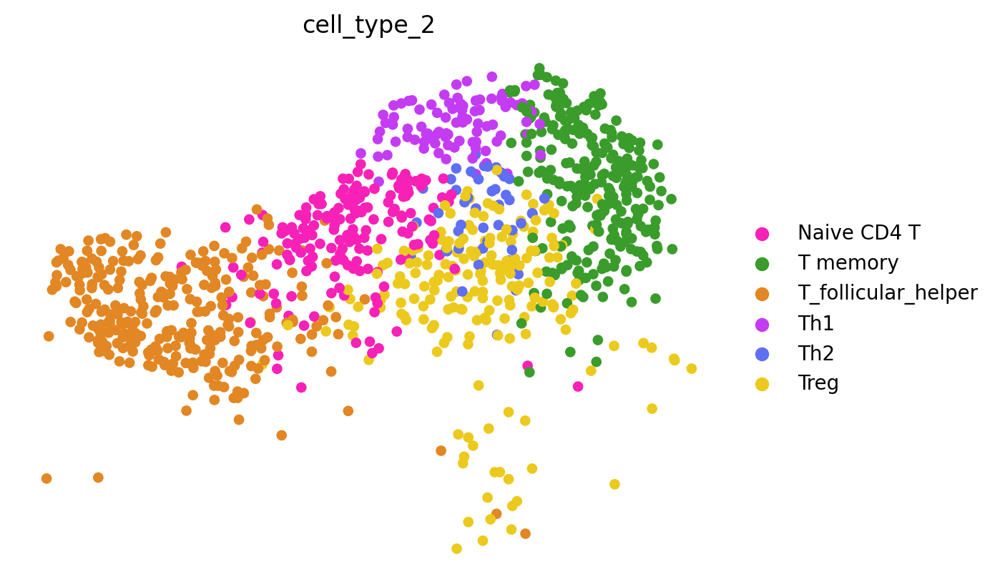

In [54]:
sc.pl.embedding(tonsil.chart.adata, 
color=['cell_type_2'], basis='umap', 
layer='imputed_count', cmap='Reds', palette=color_dict, frameon=False)

In [39]:
import glob

In [55]:
tonsil.init_cartography(adata, 
    restrict_to=[
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        # 'Treg',
        # 'T_CD8',
        # 'T memory'
    ]
)

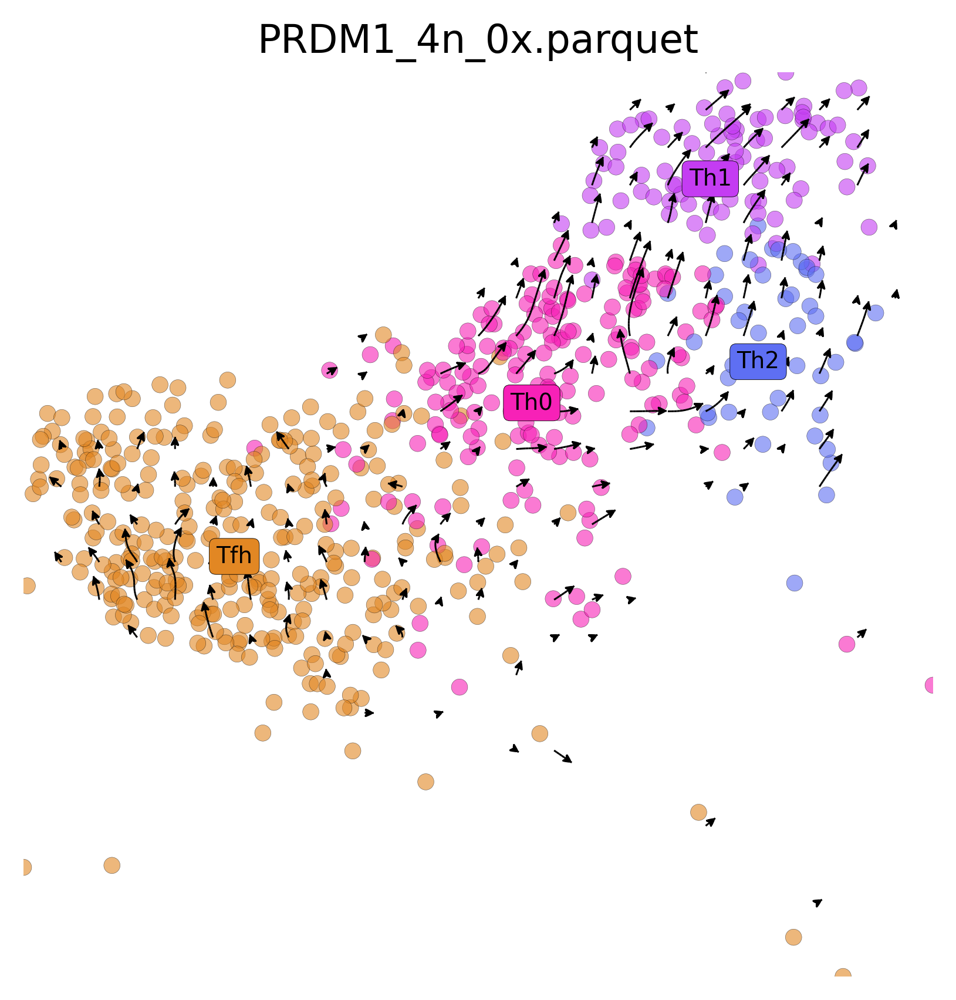

In [56]:
# i = '/tmp/PRDM1_4n_0x.parquet'
i = '/Volumes/SSD/genome_screens/human_tonsil/PRDM1_4n_0x.parquet'

perturbed_df = pd.read_parquet(i)

grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=100,
    remove_null=True,
    scale=4,
    highlight_clusters=[
        'T_follicular_helper',
        'Th1', 
        'Th2',
        'Naive CD4 T',
        # 'Treg',
        'T memory'

    ],
    threshold=0.1,
    grey_out=False,
    **plot_params
)
plt.title(i.split('/')[-1])
plt.show()

In [123]:
import scanpy.external as sce

In [124]:
# sc.pp.neighbors(adata)
# sc.tl.umap(adata)

In [197]:
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree

def calculate_cell_type_alignment(
    cell_coords, 
    grid_points, 
    grid_cosine_sim, 
    cell_types, 
    agg_func='mean'
):
    cell_coords = np.asarray(cell_coords)
    grid_points = np.asarray(grid_points)
    grid_cosine_sim = np.asarray(grid_cosine_sim)
    cell_types = np.asarray(cell_types)

    if len(cell_coords) != len(cell_types):
        raise ValueError("Length of cell_coords must match length of cell_types.")

    tree = cKDTree(grid_points)
    distances, indices = tree.query(cell_coords, k=1)
    cell_cosine_sim = grid_cosine_sim[indices]
    df = pd.DataFrame({
        'alignment': cell_cosine_sim,
        'cell_type': cell_types
    })
    
    alignment_per_ctype = df.groupby('cell_type')['alignment'].agg(agg_func)
    
    return alignment_per_ctype.sort_values(ascending=False), df

def get_umap_centroid_cells(adata, celltype_key="cell_type", umap_key="X_umap"):

    umap = adata.obsm[umap_key]
    celltypes = adata.obs[celltype_key].values
    cell_ids = adata.obs_names

    result = {}

    for ct in np.unique(celltypes):
        mask = celltypes == ct
        coords = umap[mask]

        centroid = coords.mean(axis=0)
        dists = np.linalg.norm(coords - centroid, axis=1)

        closest_idx = np.argmin(dists)
        result[ct] = cell_ids[mask][closest_idx]

    return result

In [126]:
get_umap_centroid_cells(tonsil.chart.adata, 'cell_type_2')

{'Naive CD4 T': 'TCGTAGAGTGTGGTCC-1',
 'T_follicular_helper': 'GATTGGTGTCAGGTAG-1',
 'Th1': 'CGCATGGGTTCGTTCC-1',
 'Th2': 'AGCTTCCTCAGCCTTC-1'}

In [127]:
tonsil.chart.adata.obs['gene_count'] = tonsil.chart.adata[
    tonsil.chart.adata.obs['cell_type_2'] == 'Naive CD4 T'].to_df(
    layer='imputed_count').sum(1).sort_values()

In [480]:
import warnings
import scanpy as sc
warnings.filterwarnings("ignore")

In [478]:
naive_cd4_cells = adata[adata.obs['cell_type_2']=='Naive CD4 T'].obs_names

In [497]:
naive_cd4_cells = np.random.choice(naive_cd4_cells, 10)

In [ ]:
pseudo_frames = []

for pairs in [
    ('Naive CD4 T', 'T_follicular_helper'), 
    ('Naive CD4 T', 'Treg'),
    ('Naive CD4 T', 'Th1'), ('Naive CD4 T', 'Th2')]:
    
    tonsil.init_cartography(adata, 
        restrict_to=[pairs[0], pairs[1]]
    )

    sce.tl.palantir(tonsil.chart.adata, n_components=5, knn=30)
    for ij, cell in enumerate(naive_cd4_cells):
        pltr = sc.external.tl.palantir_results(
            tonsil.chart.adata, 
            cell
        )

        _df = pltr.pseudotime.to_frame()
        _df.columns=[f'pseudotime_{pairs[0]}+{pairs[1]}_{ij}']
        # if 'pseudotime' in tonsil.chart.adata.obs.columns:
        #     del tonsil.chart.adata.obs['pseudotime']
        tonsil.chart.adata.obs = tonsil.chart.adata.obs.join(_df)

        pseudo_frames.append(
            tonsil.chart.adata.obs[
                f'pseudotime_{pairs[0]}+{pairs[1]}_{ij}'].to_frame().copy())

# _df_pst = pd.concat(pseudo_frames).fillna(0).sum(1).to_frame()
# _df_pst.columns = ['pseudotime']
# _df_pst = _df_pst.groupby(_df_pst.index).mean()

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Sampling and flocking waypoints...
Time for determining waypoints: 0.0005967815717061361 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Time for shortest paths: 0.10365709861119589 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0010227362314860027 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.0057005802790323894 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0008263190587361654 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Sampling and flocking waypoints...
Time for determining waypoints: 0.0004893183708190918 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Time for shortest paths: 0.10152896642684936 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0009071191151936848 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.004396247863769531 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0005100170771280924 minutes
Determ

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Sampling and flocking waypoints...
Time for determining waypoints: 0.000379637877146403 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Time for shortest paths: 0.10140718619028727 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0005113005638122559 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.004394682248433431 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0006395697593688965 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor 

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Sampling and flocking waypoints...
Time for determining waypoints: 0.0003432194391886393 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/Space

Time for shortest paths: 0.10160051584243775 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.0008154511451721191 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.004031431674957275 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Sampling and flocking waypoints...
Time for determining waypoints: 0.00043411652247111 minutes
Determin

In [559]:
_df_pst = pd.concat(pseudo_frames).fillna(0).sum(1).to_frame()
_df_pst.columns = ['pseudotime']
_df_pst = _df_pst.groupby(_df_pst.index).mean()

In [560]:
tonsil.init_cartography(adata, 
    restrict_to=[
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        # 'Treg',
        # 'T_CD8',
        # 'T memory'
    ]
)

In [ ]:
# _df_pst.loc[adata[adata.obs['cell_type_2']=='Naive CD4 T'].obs_names, 'pseudotime'] = 0

In [561]:
tonsil.chart.adata.obs = tonsil.chart.adata.obs.join(_df_pst)

In [ ]:
[
            ('Naive CD4 T', 'T_follicular_helper'), 
            ('Naive CD4 T', 'Treg'),
            ('Naive CD4 T', 'Th1'), ('Naive CD4 T', 'Th2')]

In [537]:
tonsil.chart.adata = smooth_obs_over_umap(tonsil.chart.adata, k=30, obs_key='pseudotime')

Fitting KNN (k=30) on X_umap coordinates...
Smoothed continuous variable 'pseudotime' -> 'pseudotime_smoothed'


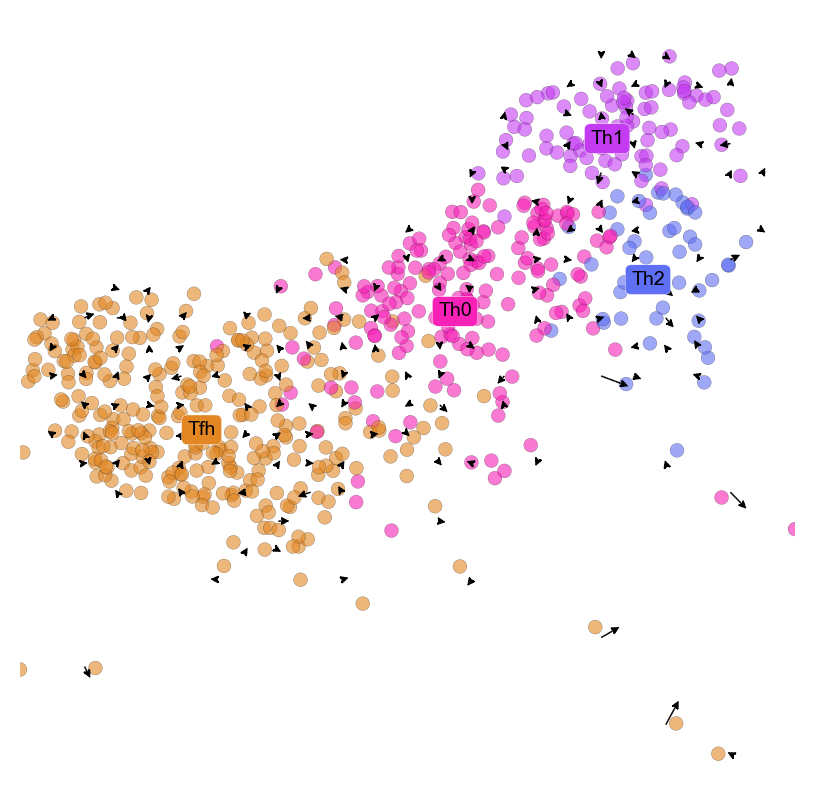

In [ ]:

perturbed_df_rand = adata.to_df(layer='imputed_count').copy()
perturbed_df_rand = pd.DataFrame(
    np.random.uniform(-50, 50, size=perturbed_df.shape),
    index=perturbed_df.index,
    columns=perturbed_df.columns
)

_, vector_field_rand = tonsil.plot_arrows(
    perturbed_df=perturbed_df_rand,
    n_neighbors=200,
    remove_null=True,
    scale=3,
    highlight_clusters=[
        'T_follicular_helper',
        'Th1', 
        'Th2',
        'Naive CD4 T',
        # 'Treg',
        'T memory'

    ],
    **plot_params
)

In [243]:
glob.glob('/Volumes/SSD/genome_screens/human_tonsil_new/*')

['/Volumes/SSD/genome_screens/human_tonsil_new/BCL6_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/BCL6_4n_1.49x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/FOXO1_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/FOXO1_4n_2.62x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/IL21_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/IL21_4n_1.01x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/IL4_4n_0.1x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/IL4_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_0x_BCL6_4n_1.5x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_0x_BCL6_4n_1.5x_IL21_4n_0x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_0x_BCL6_4n_1.5x_IL21_4n_1.5x.parquet',
 '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_1.5x_BCL6_4n_0x.parquet',
 '/Volumes/SSD/genome_sc

In [653]:
# i = '/Volumes/SSD/genome_screens/human_tonsil_new/PRDM1_4n_0x.parquet'
# perturbed_df = 0.25*pd.read_parquet(i) +\
#     pd.read_parquet('/Volumes/SSD/genome_screens/human_tonsil_new/BCL6_4n_1.49x.parquet')


i = '/Volumes/SSD/genome_screens/human_tonsil_new/IL21_4n_1.01x.parquet'
perturbed_df = pd.read_parquet(i)


_, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=100,
    remove_null=True,
    scale=3,
    highlight_clusters=[
        'T_follicular_helper',
        'Th1', 
        'Th2',
        'Naive CD4 T',
        # 'Treg',
        'T memory'

    ],
    **plot_params
)

plt.title('IL21 OE')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/SSD/genome_screens/human_tonsil_new/IL21_4n_1.01x.parquet'

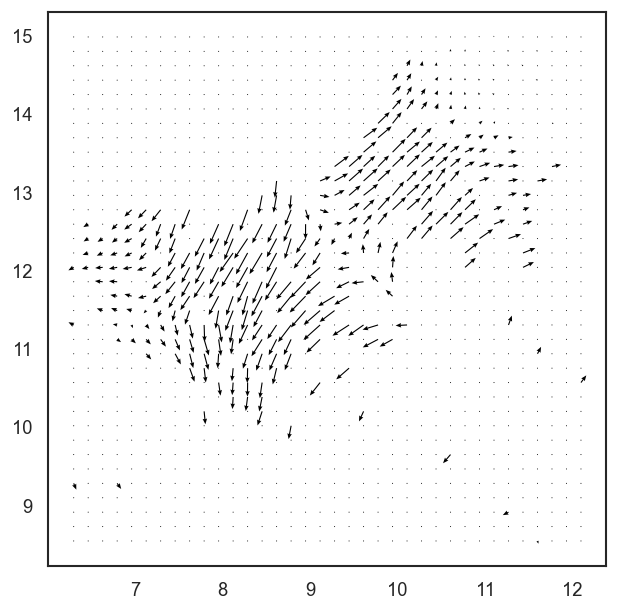

In [664]:
plt.quiver(grid_points[:, 0], grid_points[:, 1],
            ref_flow[:, 0], ref_flow[:, 1],
            scale=1, color='black', alpha=1, **quiver_params)

Fitting KNN (k=300) on X_umap coordinates...
Smoothed continuous variable 'pseudotime' -> 'pseudotime_smoothed'


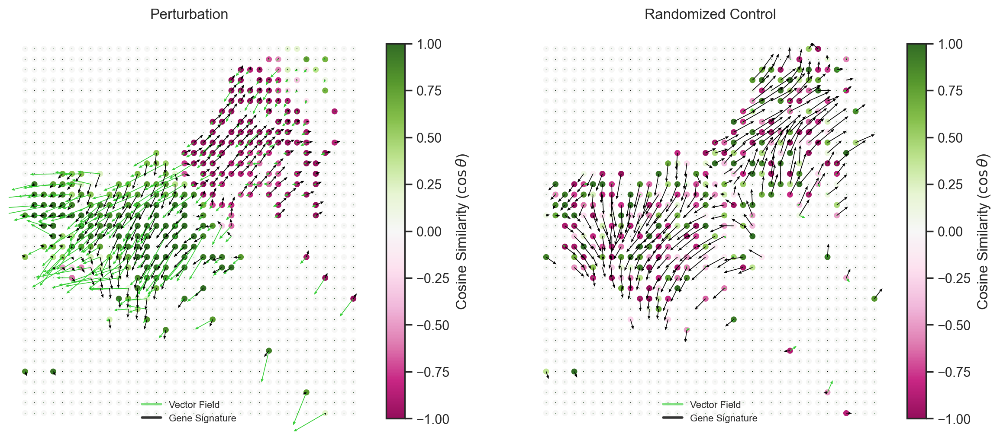

In [649]:
tonsil.chart.adata = smooth_obs_over_umap(tonsil.chart.adata, k=300, obs_key='pseudotime')

ref_flow = tonsil.signature2gradient(
    grid_points=grid_points,
    vector_field=vector_field,
    n_knn=100,
    precomputed='pseudotime_smoothed'
)

ref_flow_rand = tonsil.signature2gradient(
    grid_points=grid_points,
    vector_field=vector_field_rand,
    n_knn=100,
    precomputed='pseudotime'
)

inner_prod = np.sum(vector_field * ref_flow, axis=1)
norm_v = np.linalg.norm(vector_field, axis=1)
norm_r = np.linalg.norm(ref_flow, axis=1)
eps = 1e-8
cosine_sim = inner_prod / ((norm_v * norm_r) + eps)

inner_prod_rand = np.sum(vector_field_rand * ref_flow_rand, axis=1)
norm_v_rand = np.linalg.norm(vector_field_rand, axis=1)
norm_r_rand = np.linalg.norm(ref_flow_rand, axis=1)
cosine_sim_rand = inner_prod_rand / ((norm_v_rand * norm_r_rand) + eps)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=200, constrained_layout=True)

plot_configs = [
    {
        'ax': axes[0],
        'sim': cosine_sim,
        'vf': vector_field,
        'ref': ref_flow,
        'title': "Perturbation"
    },
    {
        'ax': axes[1],
        'sim': cosine_sim_rand,
        'vf': vector_field_rand,
        'ref': ref_flow_rand,
        'title': "Randomized Control"
    }
]

quiver_params = dict(
    angles='xy', scale_units='xy', 
    headwidth=4, headlength=5, headaxislength=4.5,
    width=0.002
)

for cfg in plot_configs:
    ax = cfg['ax']
    
    sc = ax.scatter(grid_points[:, 0], grid_points[:, 1], 
                    c=cfg['sim'], 
                    cmap='PiYG', 
                    s=25, alpha=0.95,
                    vmin=-1, vmax=1, edgecolor='none')

    ax.quiver(grid_points[:, 0], grid_points[:, 1],
            cfg['vf'][:, 0], cfg['vf'][:, 1],
            scale=4, color='limegreen', alpha=1, **quiver_params)

    ax.quiver(grid_points[:, 0], grid_points[:, 1],
            cfg['ref'][:, 0], cfg['ref'][:, 1],
            scale=1, color='black', alpha=1, **quiver_params)

    ax.set_title(cfg['title'], fontsize=12, pad=10)
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04, 
    label='Cosine Similarity ($\cos \\theta$)')

    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_aspect('equal')

    custom_lines = [Line2D([0], [0], color='limegreen', lw=2, alpha=0.6),
                    Line2D([0], [0], color='black', lw=2, alpha=0.8)]
    ax.legend(custom_lines, ['Vector Field', 'Gene Signature'], 
                loc='lower center', frameon=False, fontsize=8)


cell_coords = tonsil.chart.adata.obsm['X_umap']
cell_types = tonsil.chart.adata.obs['cell_type_2'].values
alignment_df, df = calculate_cell_type_alignment(
    cell_coords=cell_coords,
    grid_points=grid_points,
    grid_cosine_sim=cosine_sim,
    # grid_cosine_sim=inner_prod,
    cell_types=cell_types
)

alignment_df_rand, df_rand = calculate_cell_type_alignment(
    cell_coords=cell_coords,
    grid_points=grid_points,
    grid_cosine_sim=cosine_sim_rand,
    # grid_cosine_sim=inner_prod,
    cell_types=cell_types
)

In [638]:
import scanpy as sc

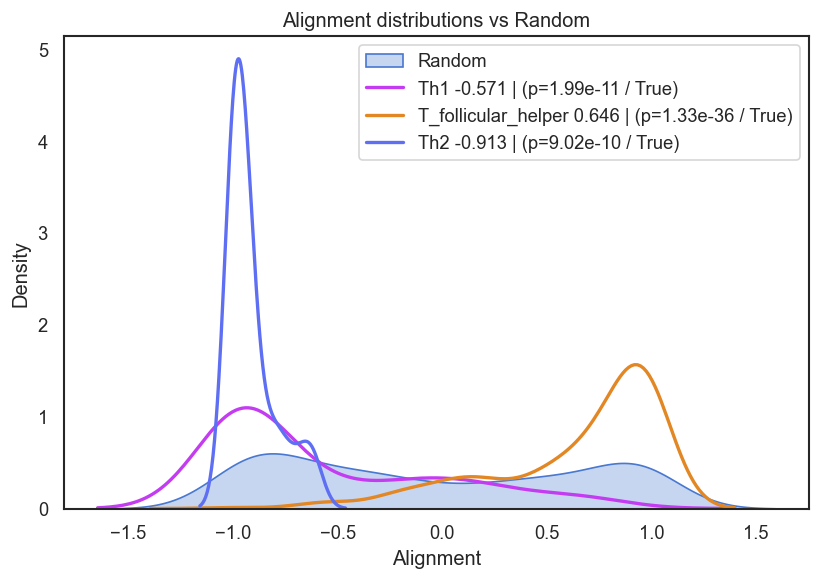

In [650]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# from scipy.stats import mannwhitneyu

plt.figure(figsize=(7, 5))

y_rand = df_rand['alignment']
sns.kdeplot(x=y_rand, fill=True, alpha=0.3, label='Random',palette=color_dict,)

for ct in ['Th1', 'T_follicular_helper', 'Th2']:
    x = df[df['cell_type'] == ct]['alignment']
    y = df_rand[df_rand['cell_type'] == ct]['alignment']
    color = color_dict[ct]
    
    stat, p = mannwhitneyu(x, y, alternative='two-sided')
    
    sns.kdeplot(
        x=x,
        fill=False,
        color=color,
        linewidth=2,
        label=f'{ct} {x.mean():.3f} | (p={p:.2e} / {p < 0.05})'
    )

plt.xlabel('Alignment')
plt.ylabel('Density')
plt.title('Alignment distributions vs Random')
plt.legend()
plt.tight_layout()
plt.show()

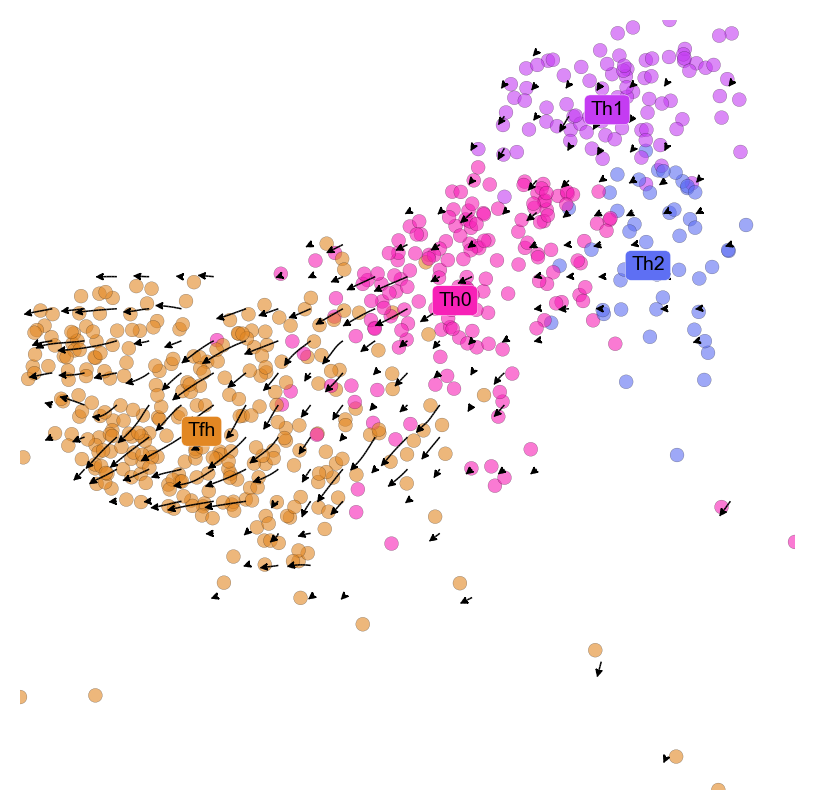

In [652]:
_ = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=100,
    remove_null=True,
    scale=3,
    highlight_clusters=[
        'T_follicular_helper',
        'Th1', 
        'Th2',
        'Naive CD4 T',
        # 'Treg',
        'T memory'

    ],
    **plot_params
)

In [594]:
df.groupby('cell_type').mean()

,alignment
cell_type,
Naive CD4 T,-0.318643
T_follicular_helper,0.680400
Th1,-0.539187
Th2,-0.847872


In [595]:
df_rand.groupby('cell_type').mean()

,alignment
cell_type,
Naive CD4 T,0.061932
T_follicular_helper,0.086201
Th1,0.115720
Th2,-0.274174


In [ ]:
# IL21_KO = -0.5558764752638613
# IL21_OE = 0.6884831998302242
# PRDM1_OE = -0.6249947573236786
# PRDM1_KO = 0.5471415154802173

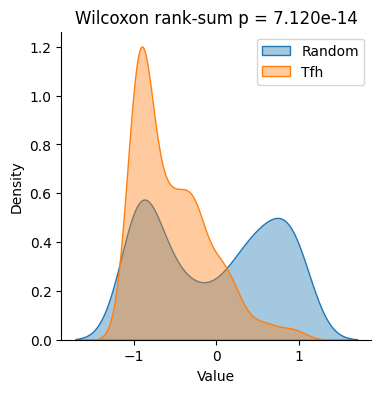

(60893.0, 7.11951475637969e-14)

In [ ]:

wilcox_kde_plot(x, y)

-0.5363534720607045

In [691]:
alignment_df

cell_type
Th1                    0.717905
Th2                    0.516166
Treg                   0.197460
Naive CD4 T           -0.164206
T_follicular_helper   -0.790395
Name: alignment, dtype: float64

In [692]:
alignment_df_rand

cell_type
Treg                   0.197362
Th1                    0.102720
Th2                    0.086483
Naive CD4 T           -0.015356
T_follicular_helper   -0.058409
Name: alignment, dtype: float64

In [38]:
# Core genes upregulated in Tfh cells
tfh_positive_markers = [
    "BCL6", "MAF", "BATF", "STAT3", "ASCL2", "TOX2",       # Master Regulators
    "CXCR5", "PDCD1", "ICOS", "SH2D1A", "CD40LG", "BTLA",  # Surface & Homing Receptors
    "IL21", "CXCL13", "IL4"                                # Effector Cytokines
]

# Genes that must be repressed to maintain the Tfh state
tfh_negative_markers = [
    "PRDM1", "CCR7", "SELL", "IL2RA"
]

# A combined flat list if you just need the entire feature set for subsetting
tfh_all_genes = tfh_positive_markers + tfh_negative_markers

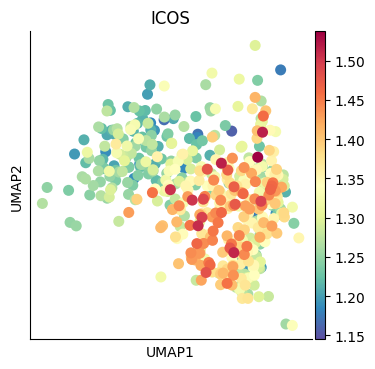

In [350]:
sc.pl.embedding(
    tonsil.chart.adata,
    # color=np.intersect1d(tonsil.chart.adata.var_names, tfh_positive_markers),
    color='ICOS',
    layer='imputed_count',
    basis='umap'

)

<Axes: ylabel='Frequency'>

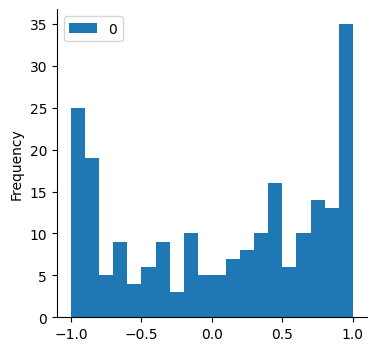

<Axes: ylabel='Frequency'>

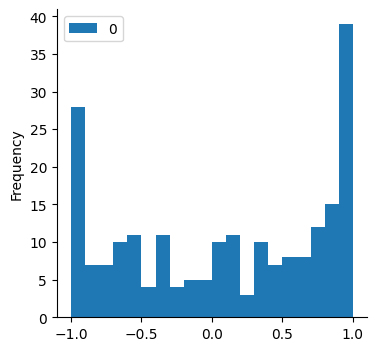

In [338]:
pd.DataFrame(cosine_sim[cosine_sim != 0]).plot.hist(bins=20)

<Axes: ylabel='Frequency'>

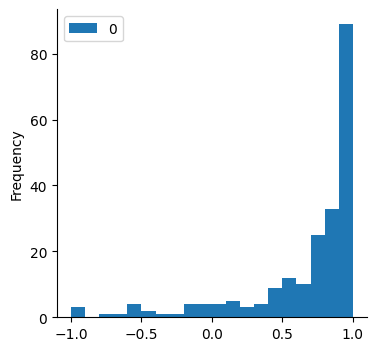

In [336]:
pd.DataFrame(cosine_sim[cosine_sim != 0]).plot.hist(bins=20)

<Axes: ylabel='Frequency'>

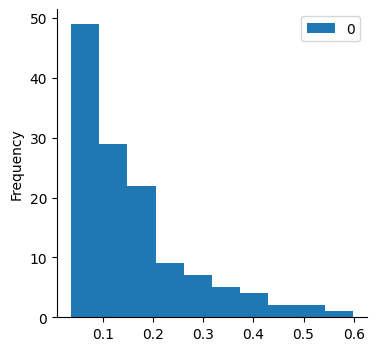

In [313]:
pd.DataFrame(inner_product[np.abs(inner_product) > inner_product.mean()].flatten()).plot.hist()

In [85]:
adata_ref = sc.read('/tmp/ref_LCMV_CD4_mouse_release_v1.h5ad')
adata_ref

AnnData object with n_obs × n_vars = 12749 × 23347
    obs: 'orig.ident', 'Sample', 'Condition', 'functional.cluster', 'nCount_RNA', 'nFeature_RNA', 'cellCycle.G1S_UCell', 'cellCycle.G2M_UCell', 'percent.ribo', 'percent.mito', 'CTgene', 'CTnt', 'CTaa', 'CTstrict', 'Frequency', 'cloneType'
    obsm: 'X_pca', 'X_umap'

In [86]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)

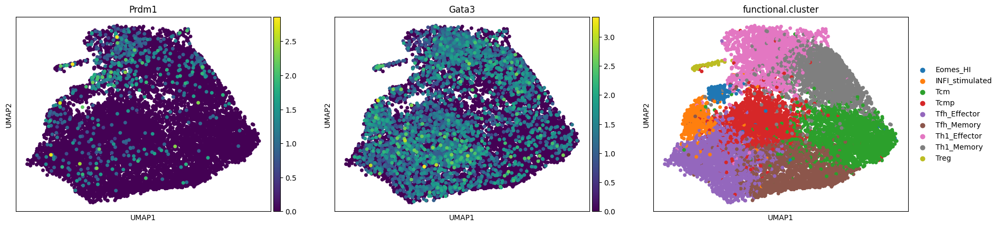

In [89]:
sc.pl.umap(adata_ref, color=['Prdm1', 'Gata3', 'functional.cluster'], s=100)

In [157]:
sc.pp.highly_variable_genes(adata_ref)
palantir.utils.run_pca(adata_ref)
palantir.utils.run_diffusion_maps(adata_ref)
imputed_X_ = palantir.utils.run_magic_imputation(adata_ref)

/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/opt/homebrew/

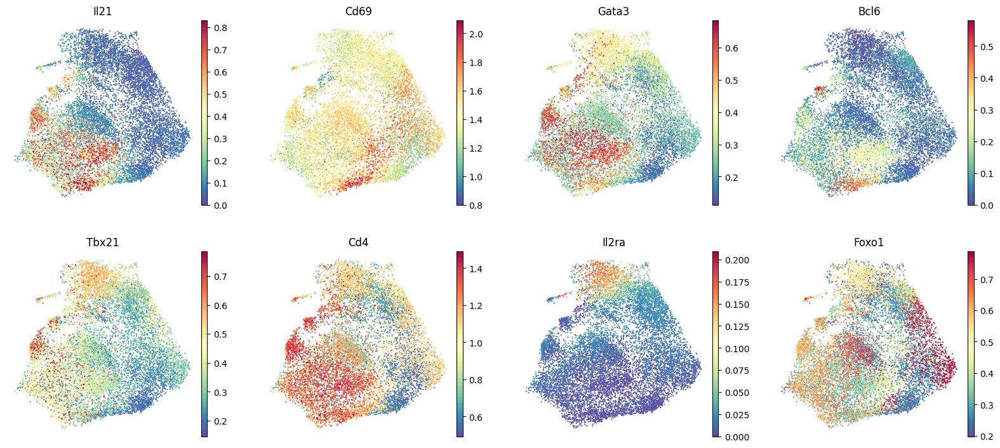

In [160]:
sc.pl.embedding(
    # tonsil.chart.adata,
    adata_ref,
    basis="umap",
    layer="MAGIC_imputed_data",
    # color=["IL21", "CD69", "GATA3", "BCL6", "TBX21", "CD4", "IL2RA", "FOXO1"],
    color=["Il21", "Cd69", "Gata3", "Bcl6", "Tbx21", "Cd4", "Il2ra", "Foxo1"],
    frameon=False,
)
plt.show()

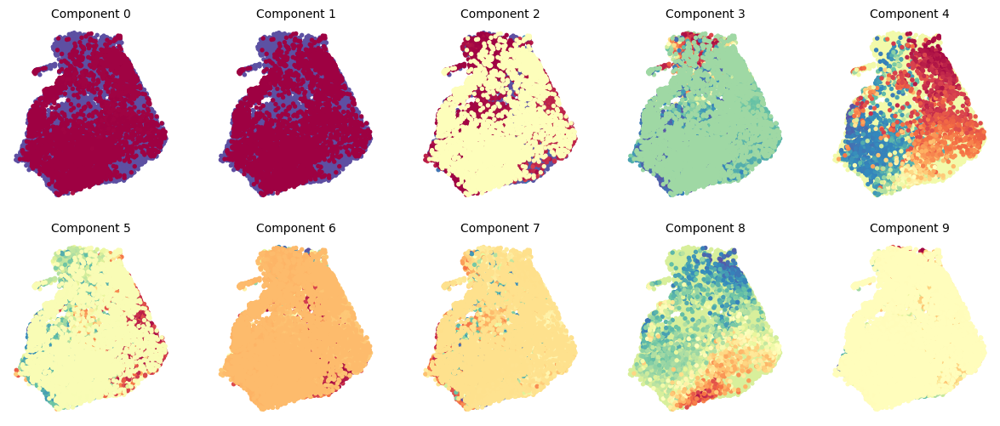

In [165]:
palantir.plot.plot_diffusion_components(adata_ref, s=15)
plt.show()

In [167]:
adata_ref.obs['functional.cluster'].value_counts()

functional.cluster
Tfh_Effector       2000
Th1_Effector       2000
Th1_Memory         2000
Tcmp               1998
Tcm                1996
Tfh_Memory         1900
INFI_stimulated     563
Eomes_HI            227
Treg                 65
Name: count, dtype: int64

In [118]:
pr_res = palantir.core.run_palantir(
    tonsil.chart.adata, 
    'GTTCTATCAGGTATGG-1', 
    num_waypoints=500, 
    # terminal_states=terminal_states
)


Sampling and flocking waypoints...
Time for determining waypoints: 0.003349316120147705 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:64: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  prop = Group((name + Suppress("=") + comma_separated(value)) | oneOf(_CONSTANTS))
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'


Time for shortest paths: 0.14644647836685182 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


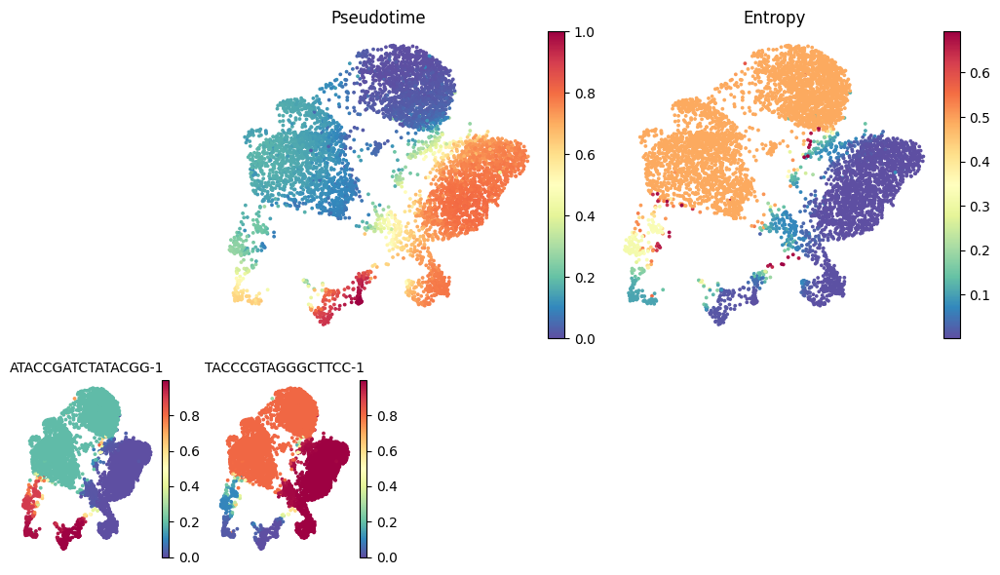

In [119]:
palantir.plot.plot_palantir_results(tonsil.chart.adata, s=3)
plt.show()

In [120]:
masks = palantir.presults.select_branch_cells(
    tonsil.chart.adata, q=.01, eps=.01)

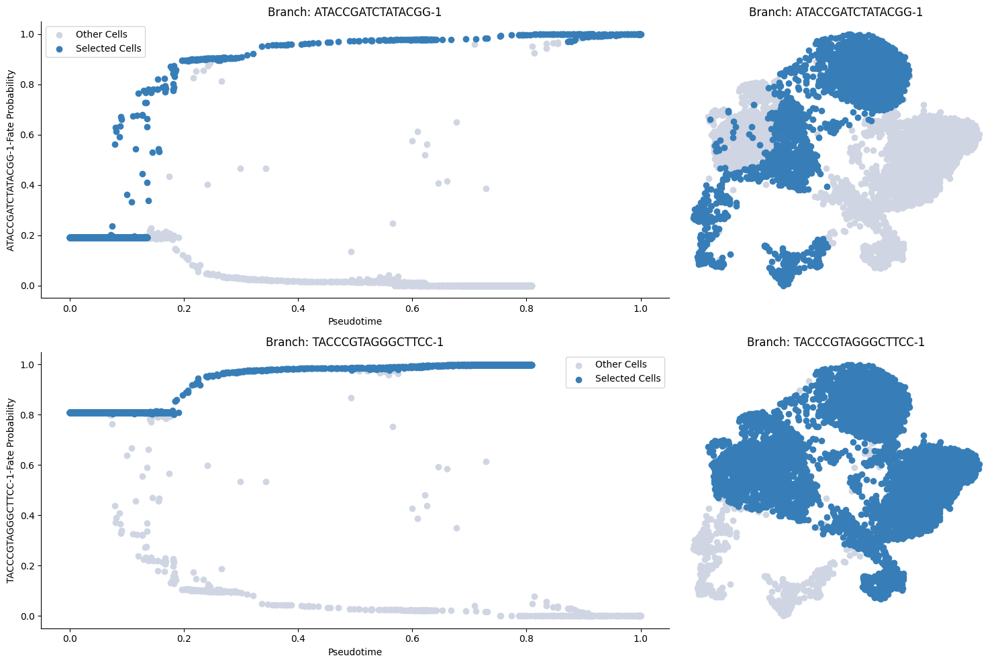

In [121]:
palantir.plot.plot_branch_selection(tonsil.chart.adata)
plt.show()

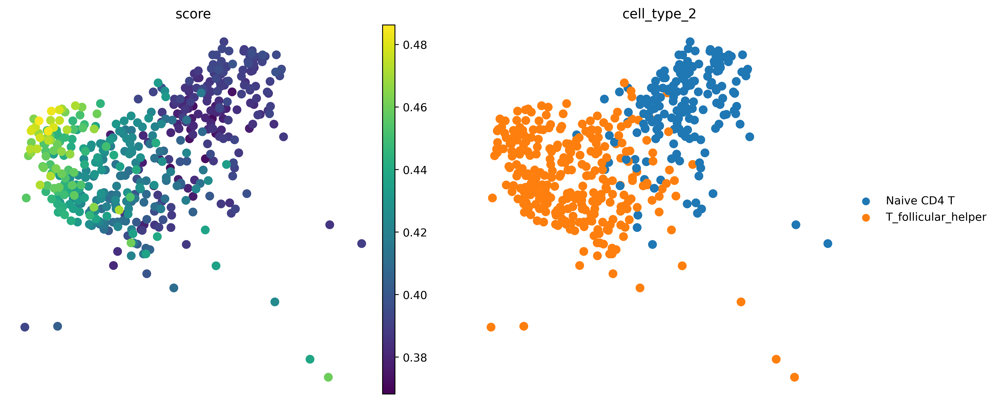

In [34]:
sc.pl.umap(tonsil.chart.adata, 
color=['score', 'cell_type_2'], frameon=False)

In [17]:
import torch

In [24]:
%config InlineBackend.figure_format = 'retina'

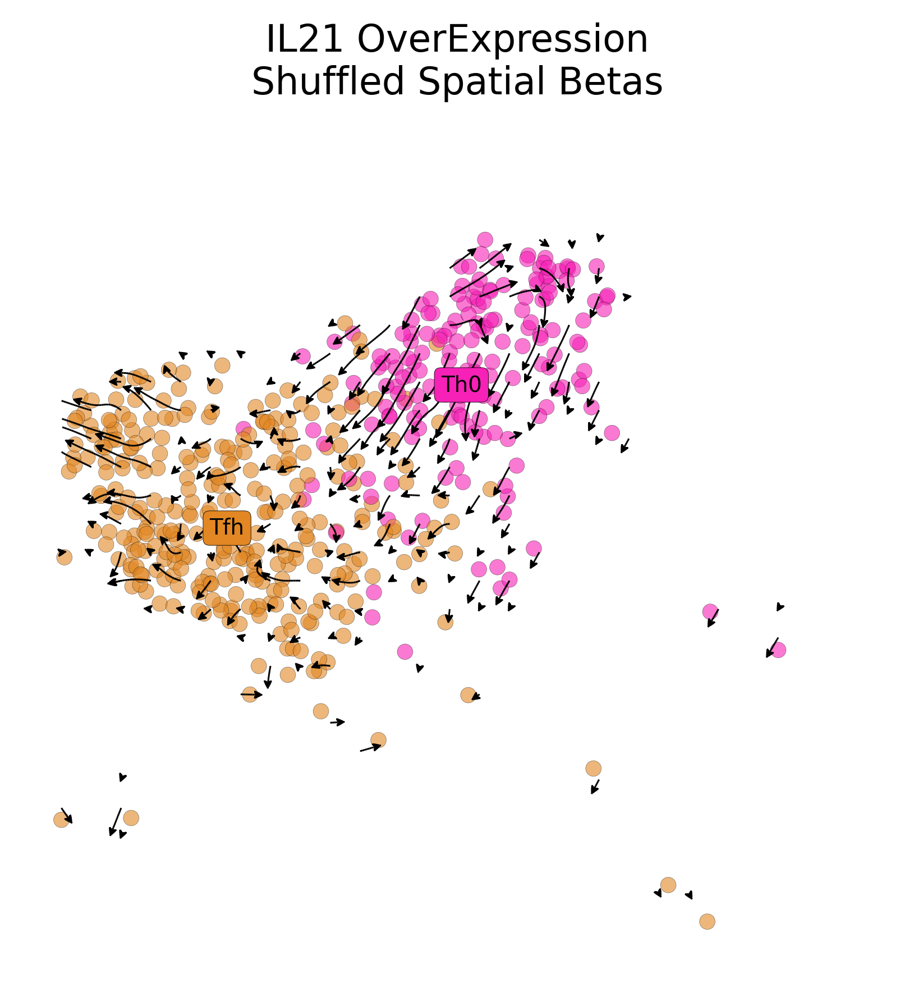

In [66]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200


# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')
perturbed_df = pd.read_parquet('/tmp/IL21_4n_1x_spatial_randomized.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=300,
    remove_null=True,
    scale=7,
    **plot_params
)

plt.title('IL21 OverExpression\nShuffled Spatial Betas')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

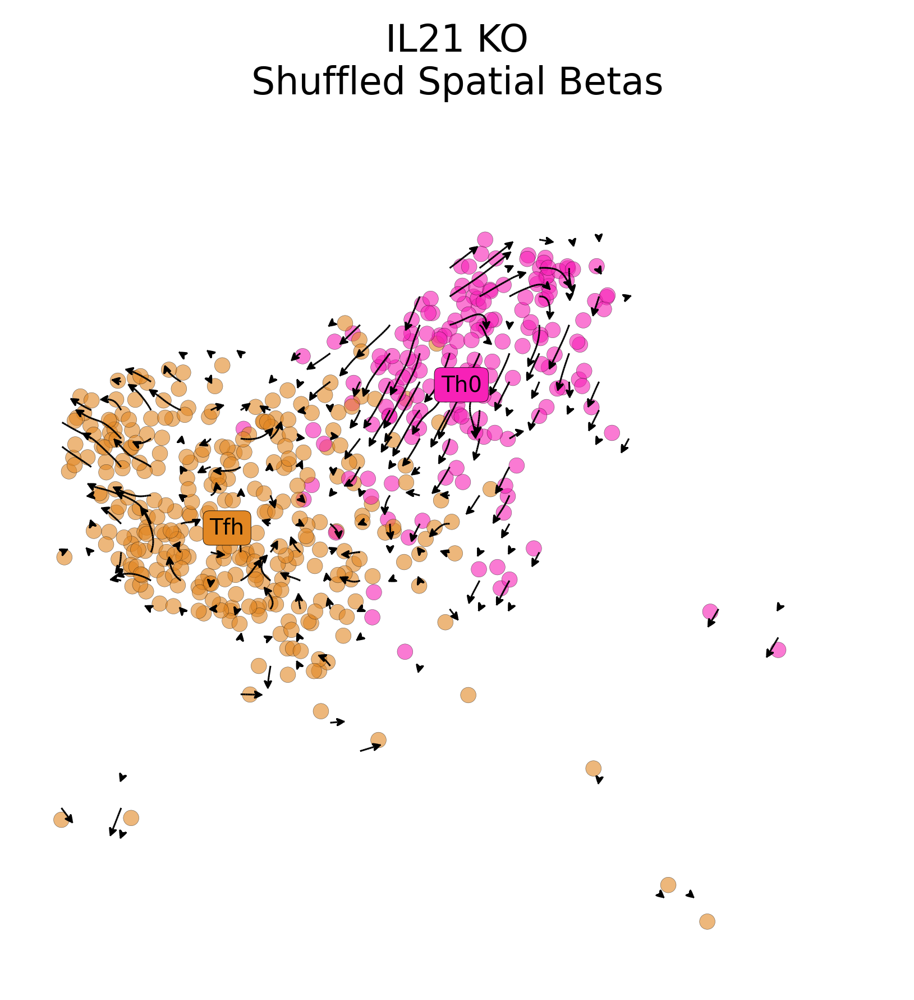

In [65]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200


# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')
# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil_random/IL21_4n_0x_spatial_randomized.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=300,
    remove_null=True,
    scale=7,
    **plot_params
)

plt.title('IL21 KO\nShuffled Spatial Betas')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

In [62]:
perturbed_df[['IL21']].mean()

Unnamed: 0
IL21    0.0
dtype: float64

In [ ]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200


# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')
perturbed_df = pd.read_parquet('/tmp/IL21_4n_1x_spatial_randomized.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=300,
    remove_null=True,
    **plot_params
)

plt.title('IL21 Randomized KO')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

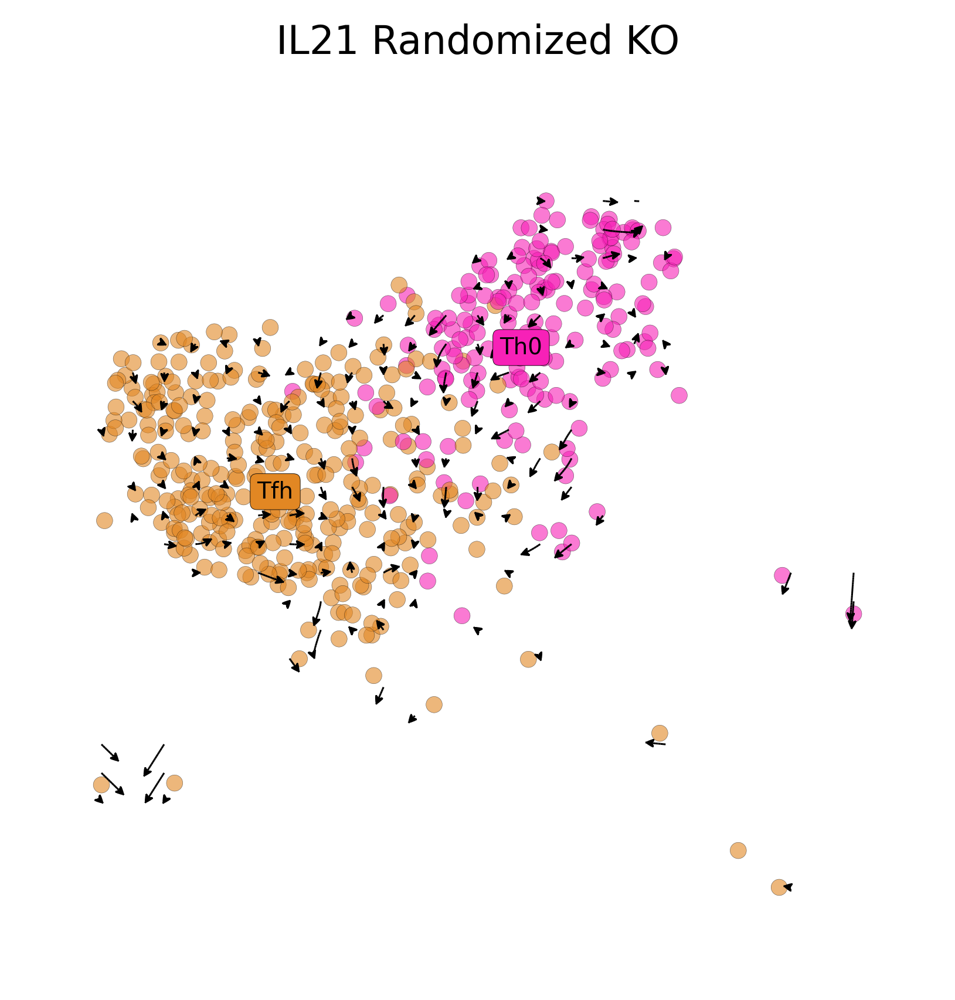

In [69]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200


# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil_random/IL21_4n_0x_randomized.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=30,
    remove_null=True,
    **plot_params
)

plt.title('IL21 Randomized KO')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

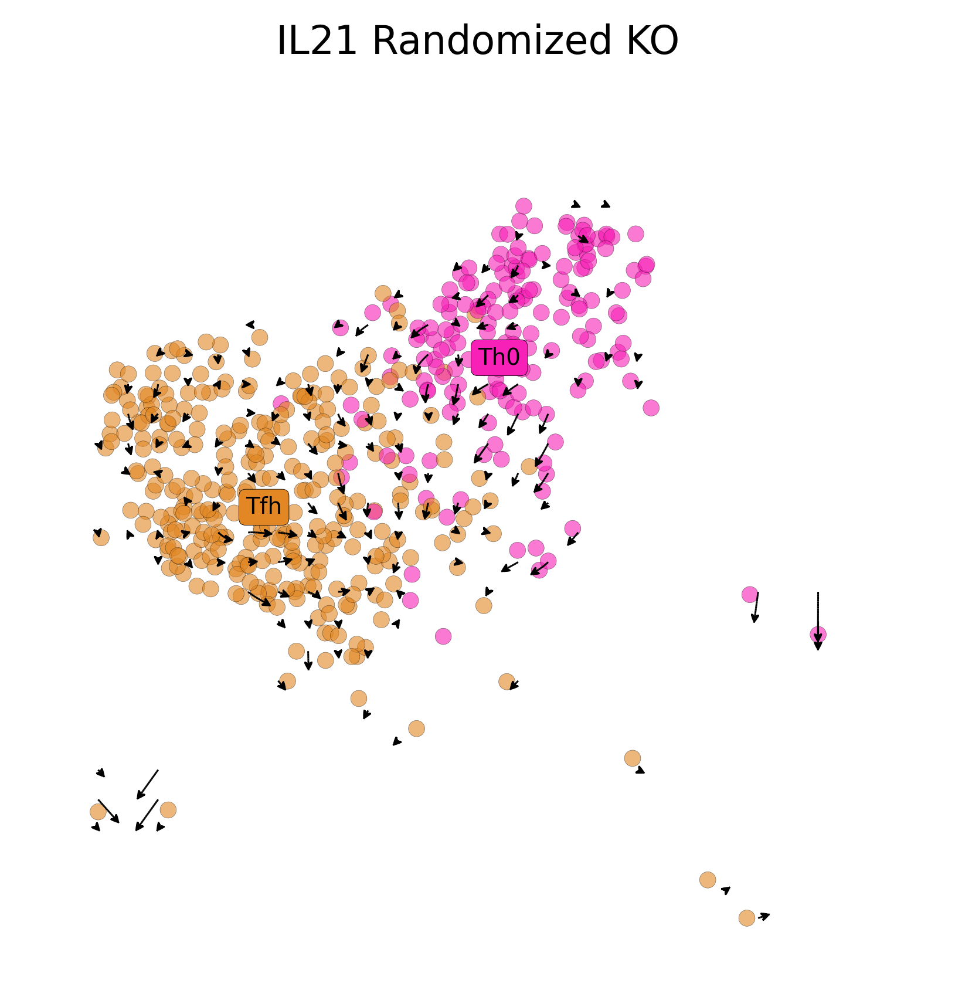

In [70]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200


# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')
perturbed_df = pd.read_parquet(
    '/Volumes/SSD/genome_screens/human_tonsil_random/IL21_4n_1x_randomized.parquet')


grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=30,
    remove_null=True,
    **plot_params
)

plt.title('IL21 Randomized KO')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

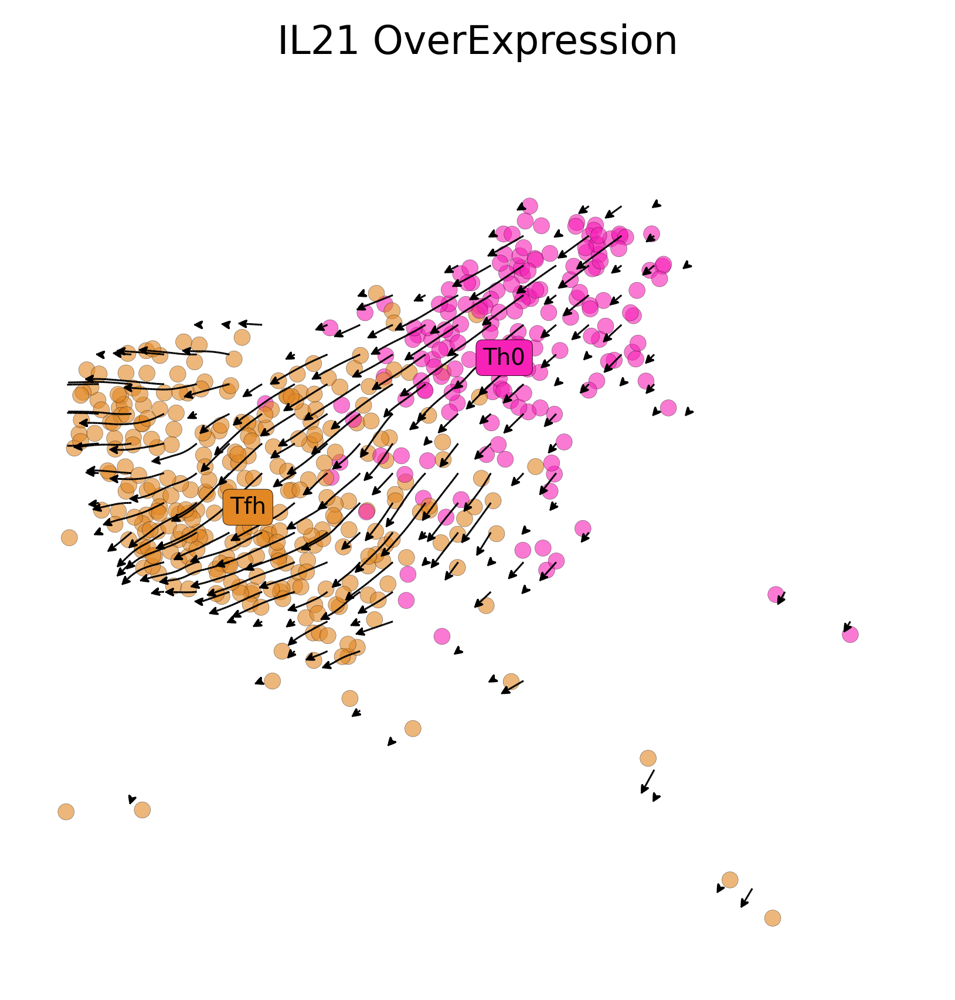

In [40]:
# perturbed_df = pd.read_parquet(
#     '/Volumes/SSD/genome_screens/human_tonsil/IL21_4n_maxx.parquet')

grid_points, vector_field = tonsil.plot_arrows(
    perturbed_df=perturbed_df,
    n_neighbors=200,
    **plot_params
)

plt.title('IL21 OverExpression')
xlim = plt.xlim()
ylim = plt.ylim()
plt.xlim(xlim[0]*0.95, xlim[1]*1.05)
plt.ylim(ylim[0]*0.95, ylim[1]*1.05)

plt.show()

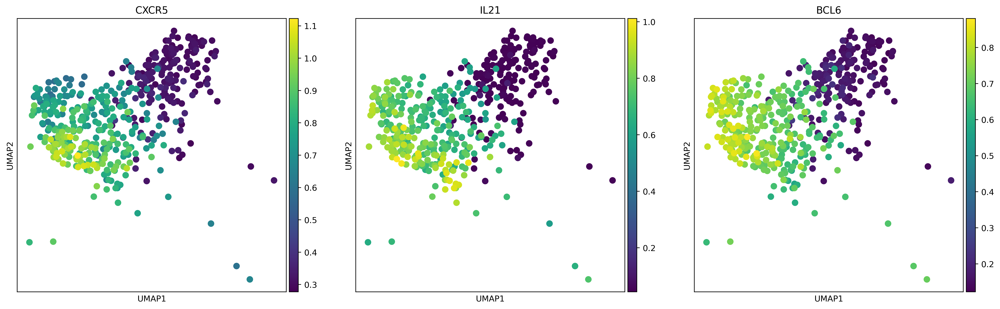

In [58]:
sc.pl.umap(tonsil.chart.adata, color=['CXCR5', 'IL21', 'BCL6'], layer='imputed_count')

In [90]:
import cellrank as cr
import scanpy as sc
import scvelo as scv

cr.settings.verbosity = 2
sc.settings.set_figure_params(frameon=False, dpi=100)

In [92]:
sc.pp.neighbors(tonsil.chart.adata)

In [96]:
sc.tl.louvain(tonsil.chart.adata)

In [101]:
sc.tl.paga(tonsil.chart.adata, groups='cell_type_2')

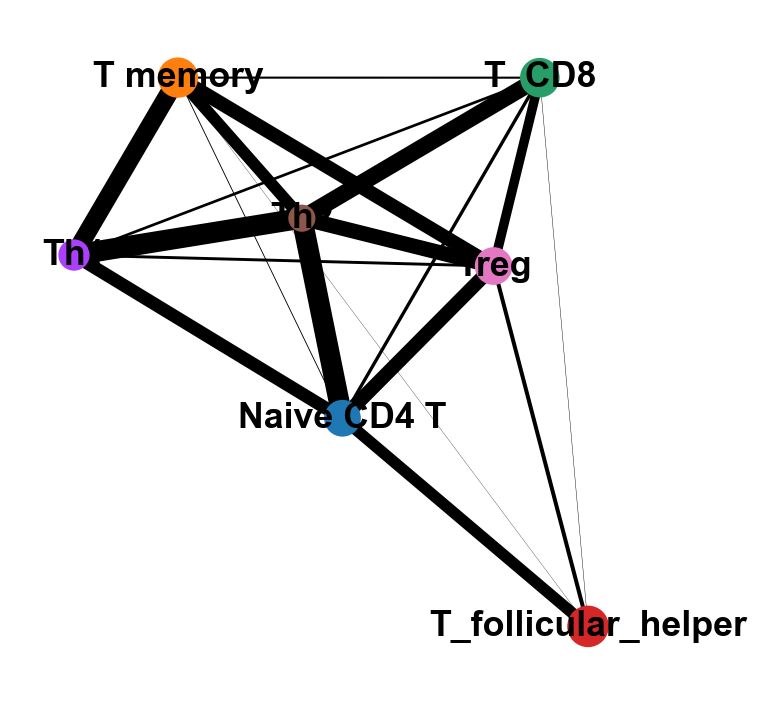

In [102]:
sc.pl.paga(tonsil.chart.adata, color='cell_type_2')

In [103]:
sc.tl.draw_graph(tonsil.chart.adata)

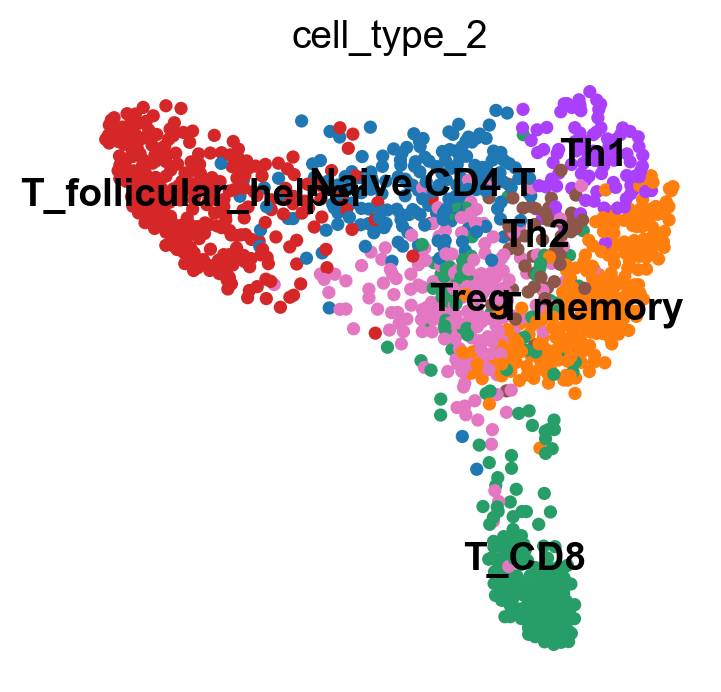

In [105]:
sc.pl.draw_graph(tonsil.chart.adata, color='cell_type_2', legend_loc='on data')


In [106]:
tonsil.chart.adata

AnnData object with n_obs × n_vars = 1318 × 3333
    obs: 'cell_type', 'author_cell_type', 'cell_type_int', 'banksy_celltypes', 'cell_type_2', 'score', 'gene_counts', 'louvain'
    uns: 'cell_thresholds', 'cell_type_int_colors', 'received_ligands', 'received_ligands_tfl', 'pca', 'neighbors', 'umap', 'draw_graph', 'louvain', 'paga', 'louvain_sizes', 'louvain_colors', 'cell_type_colors', 'cell_type_2_colors', 'cell_type_2_sizes'
    obsm: 'spatial', 'spatial_unscaled', 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'
    layers: 'imputed_count', 'normalized_count'
    obsp: 'distances', 'connectivities'

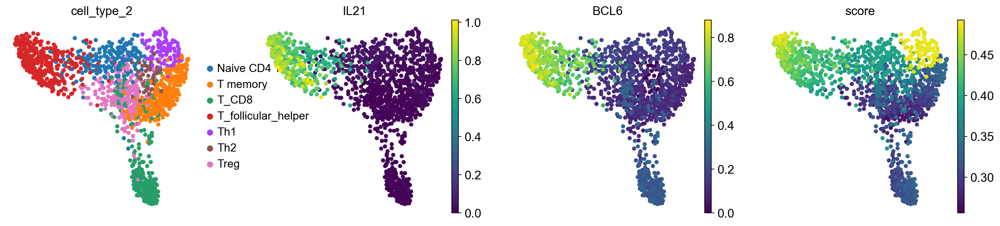

In [111]:
sc.pl.embedding(
    tonsil.chart.adata, 
    basis="X_draw_graph_fa", 
    color=["cell_type_2", "IL21", "BCL6", "score"],
    layer='imputed_count'
)

In [116]:
tonsil.chart.adata.layers["spliced"] = tonsil.chart.adata.X
tonsil.chart.adata.layers["unspliced"] = tonsil.chart.adata.X
scv.pp.moments(tonsil.chart.adata, n_pcs=30, n_neighbors=30)

/var/folders/jr/19l2mwvs76v4rv5vy8j4vrch0000gn/T/ipykernel_93054/2078390621.py:3: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(tonsil.chart.adata, n_pcs=30, n_neighbors=30)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [117]:
from cellrank.kernels import CytoTRACEKernel

ctk = CytoTRACEKernel(tonsil.chart.adata).compute_cytotrace()

Computing CytoTRACE score with `3333` genes. Consider using more than `10000` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:00)


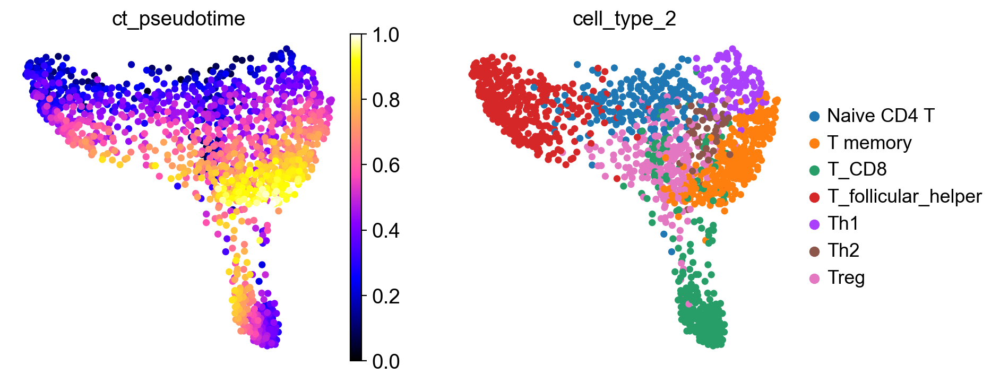

In [119]:
sc.pl.embedding(
    tonsil.chart.adata,
    color=["ct_pseudotime", "cell_type_2"],
    basis="X_draw_graph_fa",
    color_map="gnuplot2",
)

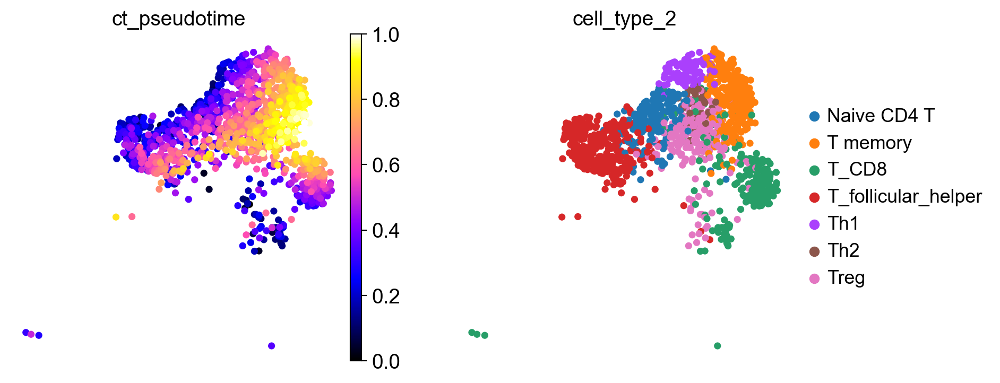

In [120]:
sc.pl.embedding(
    tonsil.chart.adata,
    color=["ct_pseudotime", "cell_type_2"],
    basis="X_umap",
    color_map="gnuplot2",
)

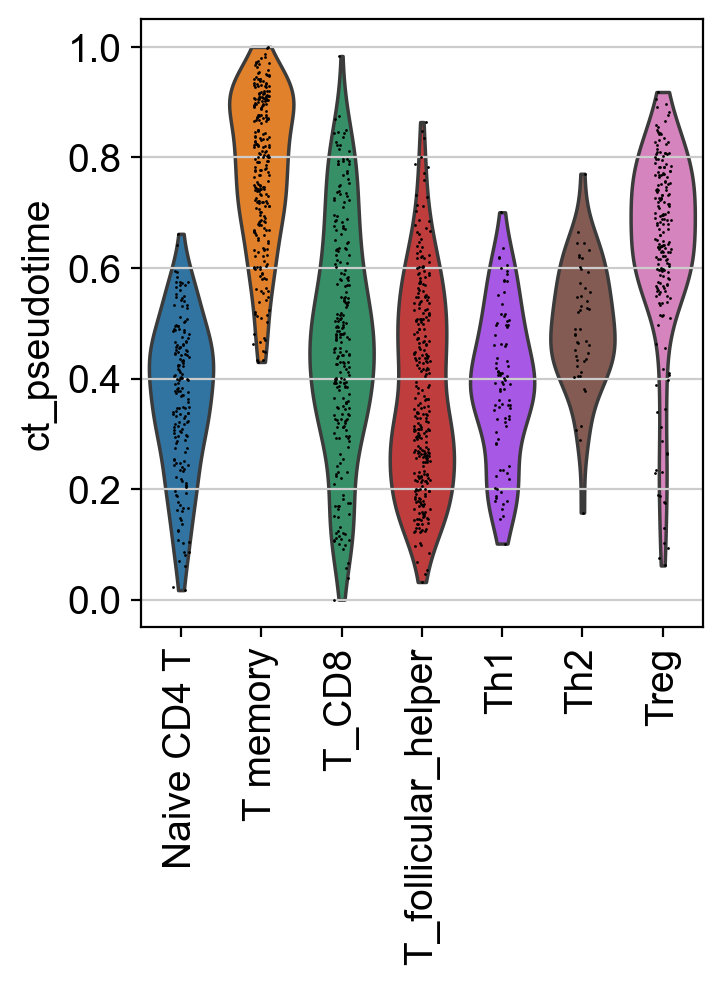

In [121]:
sc.pl.violin(tonsil.chart.adata, keys=["ct_pseudotime"], groupby="cell_type_2", rotation=90)

In [122]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)

Computing transition matrix based on pseudotime


  0%|          | 0/1318 [00:00<?, ?cell/s]

    Finish (0:00:00)


CytoTRACEKernel[n=1318, dnorm=False, scheme='soft', b=10.0, nu=0.5]

Projecting transition matrix onto `umap`
Adding `adata.obsm['T_fwd_umap']`
    Finish (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


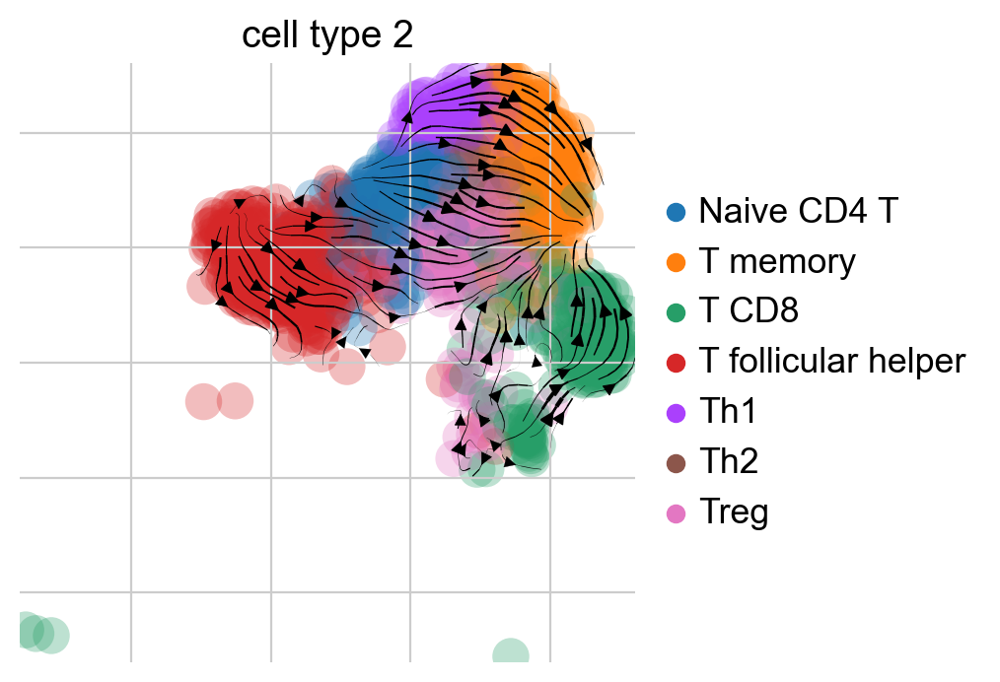

In [124]:
ctk.plot_projection(basis="X_umap", color="cell_type_2", legend_loc="right")

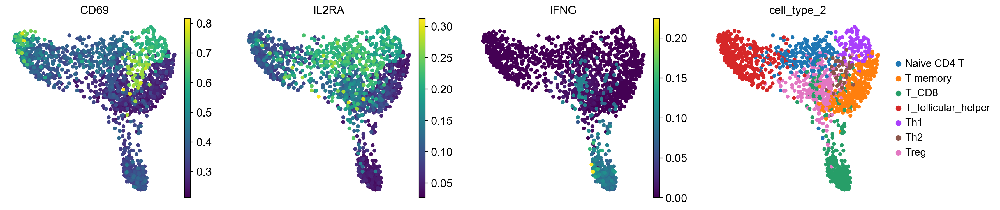

In [177]:
sc.pl.embedding(tonsil.chart.adata, 
basis='X_draw_graph_fa', color=['CD69', 'IL2RA', 'IFNG', 'cell_type_2'], layer='imputed_count')

In [3]:
import scanpy as sc

In [8]:
adata_ref = sc.read('/tmp/ref_LCMV_CD4_mouse_release_v1.h5ad')
adata_ref

AnnData object with n_obs × n_vars = 12749 × 23347
    obs: 'orig.ident', 'Sample', 'Condition', 'functional.cluster', 'nCount_RNA', 'nFeature_RNA', 'cellCycle.G1S_UCell', 'cellCycle.G2M_UCell', 'percent.ribo', 'percent.mito', 'CTgene', 'CTnt', 'CTaa', 'CTstrict', 'Frequency', 'cloneType'
    obsm: 'X_pca', 'X_umap'

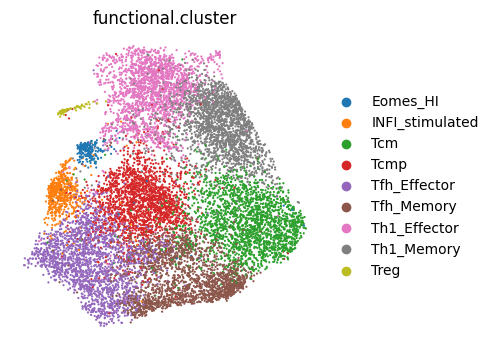

In [164]:
sc.pl.umap(adata_ref, color=['functional.cluster', ], s=10, ncols=3, frameon=False)

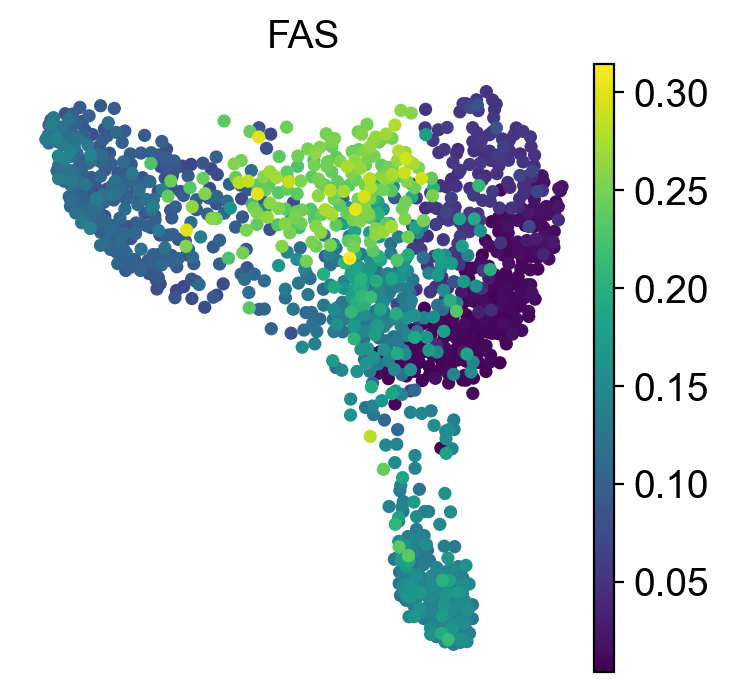

In [134]:
sc.pl.embedding(tonsil.chart.adata, basis='X_draw_graph_fa', color='FAS', layer='imputed_count')

Projecting transition matrix onto `draw_graph_fa`
Adding `adata.obsm['T_fwd_draw_graph_fa']`
    Finish (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


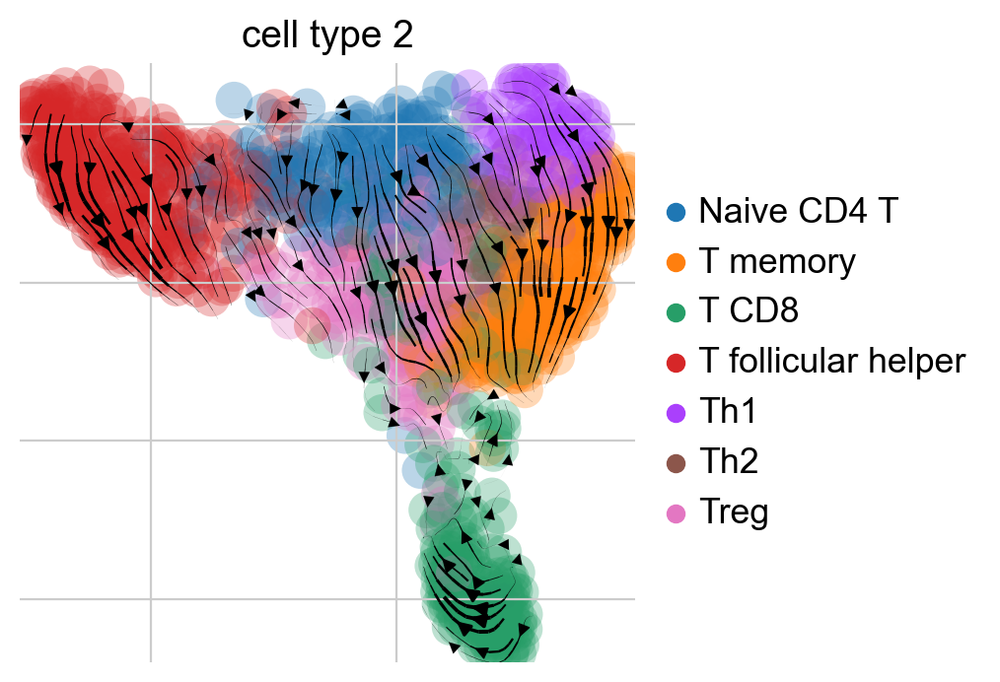

In [125]:
ctk.plot_projection(basis="X_draw_graph_fa", color="cell_type_2", legend_loc="right")

In [165]:
g = cr.estimators.GPCCA(ctk)
print(g)

GPCCA[kernel=CytoTRACEKernel[n=1318], initial_states=None, terminal_states=None]


In [166]:
g.compute_macrostates(n_states=5)

Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)
Computing `5` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


GPCCA[kernel=CytoTRACEKernel[n=1318], initial_states=None, terminal_states=None]

Adding `adata.obs['term_states_fwd']`
       `adata.obs['term_states_fwd_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


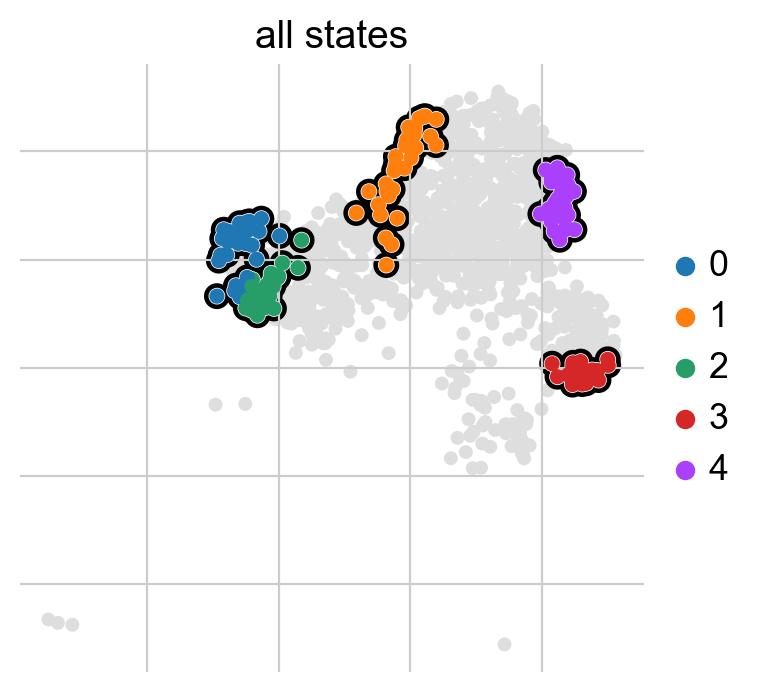

In [167]:
g.predict_terminal_states()
g.plot_macrostates(which="all", legend_loc="right", s=100)

Computing fate probabilities


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['lineages_fwd']`
       `.fate_probabilities`
    Finish (0:00:00)


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/cellrank/_utils/_linear_solver.py:230: DeprecationWarning: 'scipy.sparse.linalg.gmres' keyword argument `tol` is deprecated in favor of `rtol` and will be removed in SciPy v1.14.0. Until then, if set, it will override `rtol`.
  x, info = solver(mat_a, b.toarray().flatten(), tol=tol, x0=None, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/cellrank/_utils/_linear_solver.py:230: DeprecationWarning: 'scipy.sparse.linalg.gmres' called with `atol='legacy'`. This behavior is deprecated and will result in an error in SciPy v1.14.0. To preserve current behaviour, set `atol=0.0`.
  x, info = solver(mat_a, b.toarray().flatten(), tol=tol, x0=None, **kwargs)


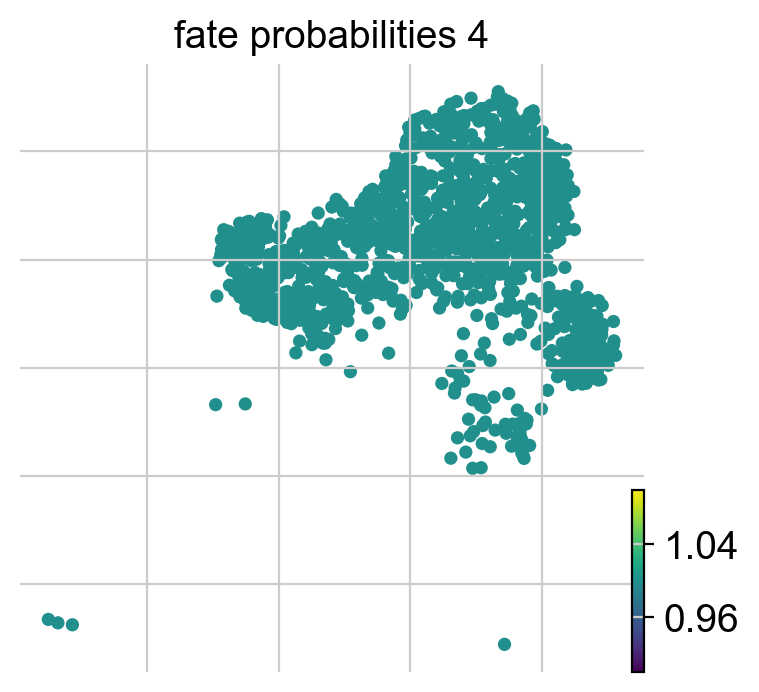

In [168]:
g.compute_fate_probabilities()
g.plot_fate_probabilities(same_plot=False)

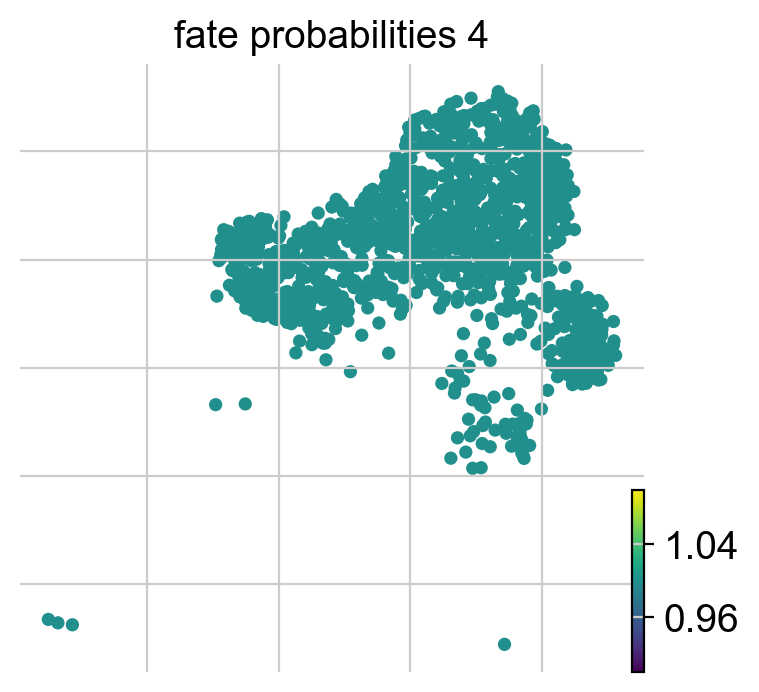

In [169]:
g.plot_fate_probabilities(same_plot=True)

In [170]:
cr.pl.circular_projection(
    tonsil.chart.adata, keys=["cell_type_2"], legend_loc="right")

ValueError: Expected at least `3` lineages, found `1`.

In [ ]:
def compute_vector_field_alignments(vector_field_ko, vector_fields_dict):
    alignments = {}
    for name, vector_field in vector_fields_dict.items():
        vector_field_norm = np.linalg.norm(vector_field, axis=1, keepdims=True)
        vector_field_ko_norm = np.linalg.norm(vector_field_ko, axis=1, keepdims=True)
        
        unit_field = vector_field / (vector_field_norm + 1e-10)
        unit_field_ko = vector_field_ko / (vector_field_ko_norm + 1e-10)
        
        inner_product = np.sum(unit_field * unit_field_ko, axis=1)
        mean_alignment = np.mean(inner_product[np.where(inner_product != 0)])
        alignments[name] = mean_alignment
        
    return alignments

def plot_vector_field_comparison(grid_points, vector_field_ko, vector_fields_dict):
    n_fields = len(vector_fields_dict)
    fig, axes = plt.subplots(2, n_fields, figsize=(4*n_fields, 8))
    
    alignments = compute_vector_field_alignments(vector_field_ko, vector_fields_dict)
    
    for i in range(n_fields):
        axes[0,i].quiver(grid_points[:, 0], grid_points[:, 1],
                        vector_field_ko[:, 0], vector_field_ko[:, 1],
                        angles='xy', scale_units='xy', scale=0.5)
        axes[0,i].set_title('Vector Field')
        
    for i, (name, vector_field) in enumerate(vector_fields_dict.items()):
        axes[1,i].quiver(grid_points[:, 0], grid_points[:, 1],
                        vector_field[:, 0], vector_field[:, 1],
                        angles='xy', scale_units='xy', scale=0.5)
        axes[1,i].set_title(f'{name} Signature\nAlignment: {alignments[name]:.3f}')
        
    plt.tight_layout()
    plt.show()